In [1]:
#Optical Character Recognition of Handwritten digits

In [2]:
import numpy as np 
import cv2
import matplotlib.pyplot as plt

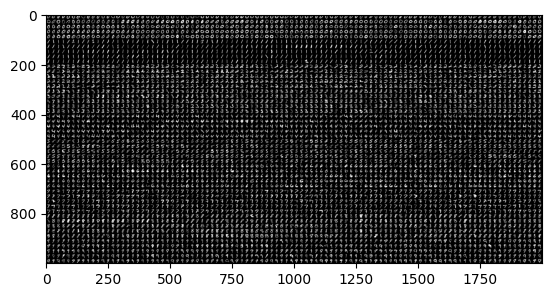

In [3]:
# Read the image 
image = cv2.imread('digits1.png')
plt.imshow(image)

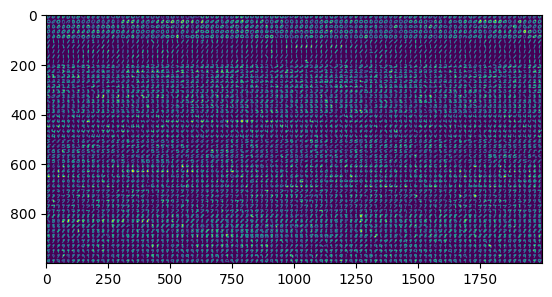

In [4]:
# gray scale conversion 
gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_img)

In [5]:
# We will divide the image 
# into 5000 small dimensions 
# of size 20x20 
divisions = list(np.hsplit(i,100) for i in np.vsplit(gray_img,50))
len(divisions)

50

In [6]:
divisions

[[array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
            0,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
            0,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   9,  33,
            9,   0,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  41, 177, 249,
          178,  29,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   0,   0,  33, 198, 255, 240,
          255, 107,   0,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,   1,  70, 199, 255, 255, 197,
          154, 253,  98,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,   0,  45, 238, 255, 205, 224, 222,
           83, 224, 128,   0,   0,   0,   0],
         [  0,   0,   0,   0,   0,   0,  25, 202, 255, 193,  40,  99,  54,
            0, 190, 197,  16,   0,   0,   0],
         [  0,   0,   0,   0,   

In [7]:
# Convert into Numpy array 
# of size (50,100,20,20) 
NP_array = np.array(divisions)

In [8]:
NP_array.shape

(50, 100, 20, 20)

In [9]:
# Preparing train_data 
# and test_data. 
# Size will be (2500,20x20) 
train_data = NP_array[:,:50].reshape(-1,400).astype(np.float32)

In [10]:
# Size will be (2500,20x20) 
test_data = NP_array[:,50:100].reshape(-1,400).astype(np.float32)

In [11]:
train_data.shape

(2500, 400)

In [12]:
test_data.shape

(2500, 400)

In [13]:
# Create 10 different labels 
# for each type of digit 
k = np.arange(10) 
train_labels = np.repeat(k,250)[:,np.newaxis] 
test_labels = np.repeat(k,250)[:,np.newaxis] 

In [14]:
train_labels

array([[0],
       [0],
       [0],
       ...,
       [9],
       [9],
       [9]])

In [15]:
test_labels

array([[0],
       [0],
       [0],
       ...,
       [9],
       [9],
       [9]])

In [16]:
# Initiate kNN classifier 
knn = cv2.ml.KNearest_create() 

In [17]:
# perform training of data 
knn.train(train_data, cv2.ml.ROW_SAMPLE, train_labels)

True

In [18]:
# obtain the output from the 
# classifier by specifying the 
# number of neighbors. 
ret, output ,neighbours, distance = knn.findNearest(test_data, k = 3)

In [19]:
distance

array([[ 361955.,  598018.,  606136.],
       [ 790595.,  959768., 1055851.],
       [ 534520.,  641045.,  681043.],
       ...,
       [ 632329.,  646093.,  712409.],
       [ 464467.,  784272.,  872704.],
       [1315263., 1358024., 1463505.]], dtype=float32)

In [20]:
output

array([[0.],
       [0.],
       [0.],
       ...,
       [9.],
       [9.],
       [9.]], dtype=float32)

In [21]:
neighbours

array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       ...,
       [9., 9., 9.],
       [9., 9., 7.],
       [9., 9., 9.]], dtype=float32)

In [22]:
ret

0.0

In [23]:
# Check the performance and 
# accuracy of the classifier. 
# Compare the output with test_labels 
# to find out how many are wrong. 
matched = output==test_labels 
correct_OP = np.count_nonzero(matched)

In [24]:
correct_OP

2291

In [25]:
#Calculate the accuracy. 
accuracy = (correct_OP*100.0)/(output.size) 

# Display accuracy. 
print(accuracy)

91.64
